In [1]:
#!python setup.py install --user
#!rm -rf $HOME/.local/lib/python3.7/site-packages/torch*
import gentrl
import torch
from rdkit.Chem import Draw
from moses.metrics import mol_passes_filters, QED, SA, logP
from moses.metrics.utils import get_n_rings, get_mol
torch.cuda.set_device(0)

RDKit WARNING: [17:32:49] Enabling RDKit 2019.09.2 jupyter extensions


In [2]:
enc = gentrl.RNNEncoder(latent_size=50)
dec = gentrl.DilConvDecoder(latent_input_size=50)
model = gentrl.GENTRL(enc, dec, 50 * [('c', 20)], [('c', 20)], beta=0.001)
model.cuda();

In [3]:
model.load('../saved_gentrl_after_rl/')
model.cuda();

In [4]:
def get_num_rings_6(mol):
    r = mol.GetRingInfo()
    return len([x for x in r.AtomRings() if len(x) > 6])


def penalized_logP(mol_or_smiles, masked=True, default=-5):
    mol = get_mol(mol_or_smiles)
    if mol is None:
        return default
    reward = logP(mol) - SA(mol) - get_num_rings_6(mol)
    if masked and not mol_passes_filters(mol):
        return default
    return reward

In [5]:
generated = []

while len(generated) < 1000:
    sampled = model.sample(100)
    sampled_valid = [s for s in sampled if get_mol(s)]
    
    generated += sampled_valid

RDKit ERROR: [17:34:32] SMILES Parse Error: syntax error while parsing: 3S-BrCl3O(3
RDKit ERROR: [17:34:32] SMILES Parse Error: Failed parsing SMILES '3S-BrCl3O(3' for input: '3S-BrCl3O(3'
RDKit ERROR: [17:34:32] SMILES Parse Error: syntax error while parsing: FF-6=(o[NOCl3c==SsBrClSS(s3C=4N-]N3-S)NCl2c[5on
RDKit ERROR: [17:34:32] SMILES Parse Error: Failed parsing SMILES 'FF-6=(o[NOCl3c==SsBrClSS(s3C=4N-]N3-S)NCl2c[5on' for input: 'FF-6=(o[NOCl3c==SsBrClSS(s3C=4N-]N3-S)NCl2c[5on'
RDKit ERROR: [17:34:32] SMILES Parse Error: syntax error while parsing: ]1Cls--(-[)S-=NF]NCl[BrCl-)CNN-ClNFClc6155(-(62-ClCl3(
RDKit ERROR: [17:34:32] SMILES Parse Error: Failed parsing SMILES ']1Cls--(-[)S-=NF]NCl[BrCl-)CNN-ClNFClc6155(-(62-ClCl3(' for input: ']1Cls--(-[)S-=NF]NCl[BrCl-)CNN-ClNFClc6155(-(62-ClCl3('
RDKit ERROR: [17:34:32] SMILES Parse Error: syntax error while parsing: 3ClS]
RDKit ERROR: [17:34:32] SMILES Parse Error: Failed parsing SMILES '3ClS]' for input: '3ClS]'
RDKit ERROR: [17:34:32] S

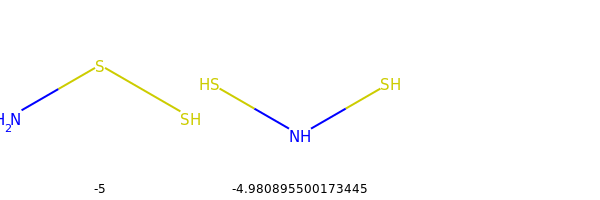

In [6]:
Draw.MolsToGridImage([get_mol(s) for s in sampled_valid], 
                     legends=[str(penalized_logP(s)) for s in sampled_valid])